# EDA

Dataset from https://www.kaggle.com/datasets/anshankul/ibm-amlsim-example-dataset?select=transactions.csv

# Extract data and analyze

In [1]:
# Extract
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

accounts_df = pd.read_csv('data/accounts.csv')
alerts_df = pd.read_csv('data/alerts.csv')

# Read zip file
import zipfile
import os

with zipfile.ZipFile('data/transactions.csv.zip', 'r') as zip_ref:
    zip_ref.extractall('data')

transaction_df = pd.read_csv('data/transactions.csv')

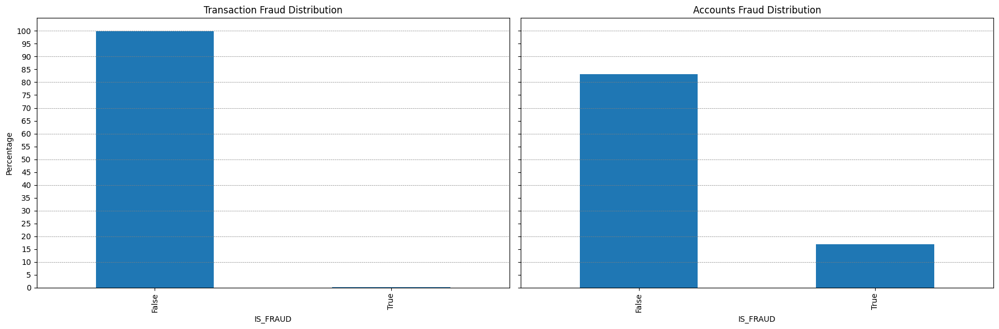

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming transaction_df, accounts_df, and alerts_df are your DataFrames
distributions = (
    transaction_df.groupby('IS_FRAUD').size(),
    accounts_df.groupby('IS_FRAUD').size()
)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Titles for each subplot
titles = ['Transaction Fraud Distribution', 'Accounts Fraud Distribution']

# Plot each distribution in a separate subplot
for ax, df, title in zip(axes, distributions, titles):
    percentage_by_group = (df / df.sum()) * 100
    percentage_by_group.plot(kind='bar', ax=ax)
    ax.set_xlabel('IS_FRAUD')
    ax.set_ylabel('Percentage')
    ax.set_title(title)
    ax.set_yticks(range(0, 101, 5))

    # Add horizontal lines at specified y-values
    for y in range(0, 101, 10):
        ax.axhline(y=y, color='gray', linestyle='--', linewidth=0.5)

# Adjust layout
plt.tight_layout()
plt.show()

# Build graph

Build graph using "networkX"

In [3]:
# Build graph from the data
import networkx as nx
from sklearn.model_selection import train_test_split

number_of_transactions = 30000
G = nx.DiGraph()

df = df, _ = train_test_split(transaction_df, test_size=0.1, stratify=transaction_df['IS_FRAUD'], random_state=42)
df = df.sample(number_of_transactions, replace=True)
aggregation = {}


In [4]:
for it in df.groupby(['SENDER_ACCOUNT_ID', 'RECEIVER_ACCOUNT_ID']).count().itertuples():
    sender_acc_id = it[0][0]
    receiver_acc_id = it[0][1]

    

In [5]:

count = 0
# for t in df.itertuples():
grouped_by_sender_receiver_df = df.groupby(['SENDER_ACCOUNT_ID', 'RECEIVER_ACCOUNT_ID']).count()
for it in grouped_by_sender_receiver_df.itertuples():
    sender_id = it[0][0]
    receiver_id = it[0][1]
    # sender_id = t.SENDER_ACCOUNT_ID
    # receiver_id = t.RECEIVER_ACCOUNT_ID

    sender_acc = accounts_df[accounts_df.ACCOUNT_ID == sender_id].iloc[0]
    sender = {
        "id": sender_id,
        "type": "account",
        "country": sender_acc.COUNTRY,
        "customer_id": sender_acc.CUSTOMER_ID,
        "is_fraud": bool(sender_acc.IS_FRAUD),
    }

    receiver_acc = accounts_df[accounts_df.ACCOUNT_ID == receiver_id].iloc[0]
    receiver = {
        "id": receiver_id,
        "type": "account",
        "country": receiver_acc.COUNTRY,
        "customer_id": receiver_acc.CUSTOMER_ID,
        "is_fraud": bool(receiver_acc.IS_FRAUD),
    }

    pair_key = f"{sender_id}-{receiver_id}"

    if pair_key not in aggregation:
        pair_transactions = transaction_df.query("SENDER_ACCOUNT_ID == @sender_id and RECEIVER_ACCOUNT_ID == @receiver_id")

        # Proportion of fraud transactions
        fraud_proportion = len(pair_transactions.query("IS_FRAUD == True")) / len(pair_transactions)


        aggregation[pair_key] = {
            "total_transactions": len(pair_transactions),
            "total_amount": pair_transactions["TX_AMOUNT"].sum(),
            "min_amount": pair_transactions["TX_AMOUNT"].min(),
            "max_amount": pair_transactions["TX_AMOUNT"].max(),
            "mean_amount": pair_transactions["TX_AMOUNT"].mean(),
            "total_transactions": len(pair_transactions),
            "fraud_proportion": fraud_proportion,
        }

    

    tx_edge_attrs = {
        **aggregation[pair_key]
    }

    # account_ownership_attrs = {"type": "owns"}

    # Accounts
    G.add_node(sender_id, **sender)
    G.add_node(receiver_id, **receiver)

    # Customers
    # G.add_node(sender["customer_id"], **{"type": "customer", "is_fraud": sender["is_fraud"]})
    # G.add_node(receiver["customer_id"], **{"type": "customer", "is_fraud": receiver["is_fraud"]})

    # Transactions
    G.add_edge(sender_id, receiver_id, **tx_edge_attrs)

    # Customer to account
    # G.add_edge(sender["customer_id"], sender_id, **account_ownership_attrs)
    # G.add_edge(receiver["customer_id"], receiver_id, **account_ownership_attrs)

    # Print progress
    count += 1
    if count % 1000 == 0:
        print(f"{count}/{len(grouped_by_sender_receiver_df)} processed")
    

1000/19559 processed
2000/19559 processed
3000/19559 processed
4000/19559 processed
5000/19559 processed
6000/19559 processed
7000/19559 processed
8000/19559 processed
9000/19559 processed
10000/19559 processed
11000/19559 processed
12000/19559 processed
13000/19559 processed
14000/19559 processed
15000/19559 processed
16000/19559 processed
17000/19559 processed
18000/19559 processed
19000/19559 processed


In [6]:
for a, b, attrs in G.edges(data=True):
    if attrs["fraud_proportion"] > 0:
        print(a, b, attrs)

9755 3746 {'total_transactions': 21, 'total_amount': np.float64(2088.7500000000005), 'min_amount': np.float64(3.55), 'max_amount': np.float64(104.26), 'mean_amount': np.float64(99.46428571428574), 'fraud_proportion': 0.047619047619047616}
9768 1854 {'total_transactions': 21, 'total_amount': np.float64(3242.4), 'min_amount': np.float64(3.6), 'max_amount': np.float64(161.94), 'mean_amount': np.float64(154.4), 'fraud_proportion': 0.047619047619047616}
9757 1854 {'total_transactions': 21, 'total_amount': np.float64(3479.650000000001), 'min_amount': np.float64(4.05), 'max_amount': np.float64(173.78), 'mean_amount': np.float64(165.6976190476191), 'fraud_proportion': 0.047619047619047616}
6685 8881 {'total_transactions': 21, 'total_amount': np.float64(3616.8299999999995), 'min_amount': np.float64(3.63), 'max_amount': np.float64(180.66), 'mean_amount': np.float64(172.22999999999996), 'fraud_proportion': 0.047619047619047616}
9088 498 {'total_transactions': 20, 'total_amount': np.float64(137.77

# Build graph in a database

Instead of dealing with the graph just using "networkX", this step will go further and will create a graph databse that supports Cypher queries.

In [7]:
# import mgclient

# # Connect to Memgraph
# conn = mgclient.connect(host="127.0.0.1", port=7687)
# cursor = conn.cursor()

# # Drop all nodes and edges
# cursor.execute("MATCH (n) DETACH DELETE n")

# # Create nodes and edges in Memgraph
# nodes_size = G.number_of_nodes()
# count = 0
# for id, node_attrs in G.nodes(data=True):
#     # if node_attrs["type"] == "account":
#     tag = "Account"
#     query_attrs = "{id: $id}"
#     query_params = {**node_attrs}
#     cursor.execute(f"CREATE (:{tag} {query_attrs})", query_params)
#     # else:
#     #     tag = "Customer"
#     #     query_attrs = "{id: $id}"
#     #     cursor.execute(
#     #         f"CREATE (:{tag} {query_attrs})",
#     #         {"id": id},
#     #     )

#     print(f"Progress: {count}/{nodes_size}")


# # Create edges in Memgraph
# edges_size = G.number_of_edges()
# count = 0
# for a, b, edge_attrs in G.edges(data=True):
#     # print(a, b, key, edge_attrs)

#     # if edge_attrs['type'] == 'transfer':
#     # Create edge
#     query_attrs = ""
#     cursor.execute(
#         f"""
#         MATCH (a), (b)
#         WHERE a.id = $a AND b.id = $b
#         CREATE (a)-[r:TRANSFER]->(b)
#     """,
#         {
#             "a": a,
#             "b": b
#             # "amount": edge_attrs["amount"],
#             # "timestamp": edge_attrs["timestamp"],
#             # "is_fraud": edge_attrs["is_fraud"],
#         },
#     )
#     # else:
#     #     # Create edge
#     #     query_attrs = "{type: $type}"
#     #     cursor.execute(f"""
#     #         MATCH (a), (b)
#     #         WHERE a.id = $a AND b.id = $b
#     #         MERGE (a)-[r:OWNS {query_attrs}]->(b)
#     #         ON CREATE SET r.type = $type
#     #     """, {'a': a, 'b': b, 'type': edge_attrs['type']})

#     count += 1
#     print(f"Progress: {count}/{edges_size}")

# # Commit the transaction
# conn.commit()

# # Close the connection
# cursor.close()
# conn.close()

In [8]:
# Export to graphml
nx.write_graphml(G, "data/graph.graphml")

# Plot the graph
To visually "see" the graph.

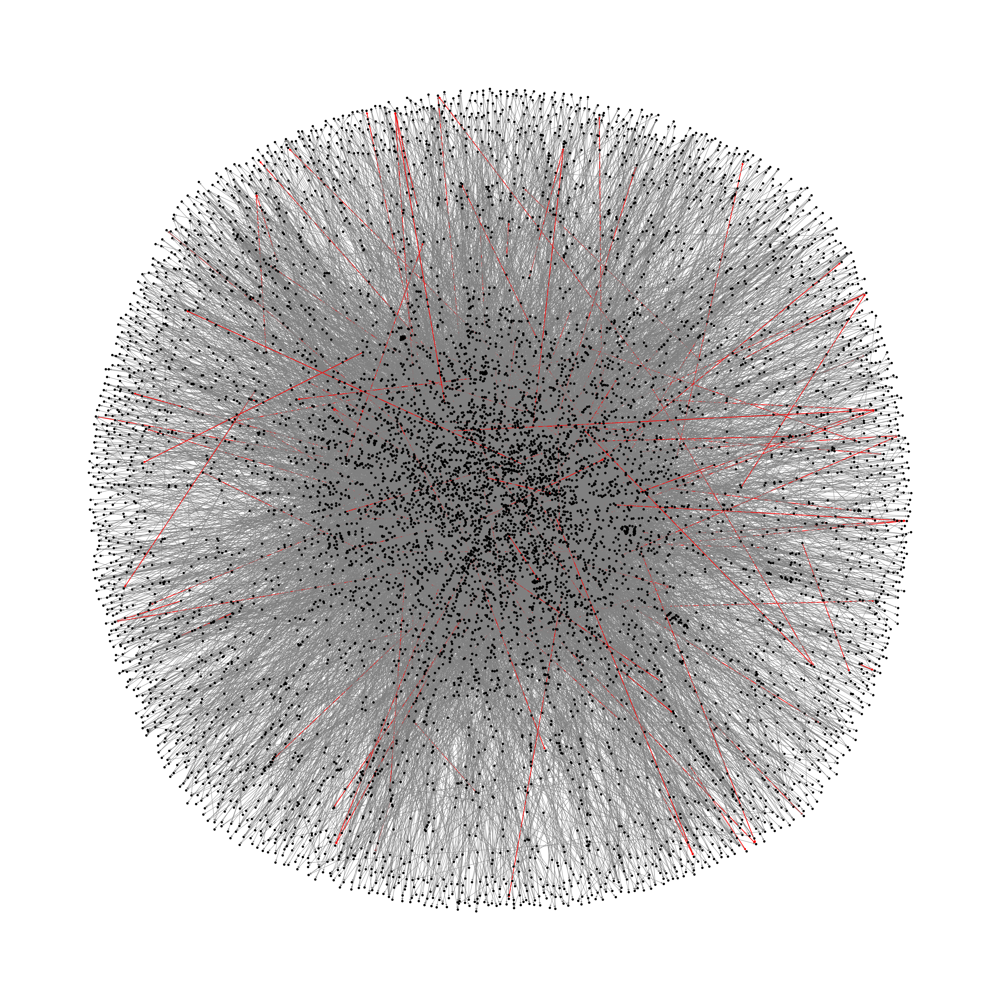

In [9]:
#  Render the graph using matplotlib
plt.figure(figsize=(40, 40))
pos = nx.shell_layout(G)

edge_colors = ["red" if attrs.get("fraud_proportion") > 0 else "grey" for a, b, attrs in G.edges(data=True)]

# Nomralization of edge sizes
edges_sizes = [2 if attrs["fraud_proportion"] > 0 else 1.0  for a, b, attrs in G.edges(data=True)]

# nx.draw_networkx_edges(G, pos, edge_color=edge_colors)
# nx.draw_networkx_nodes(G, pos, node_size=5, node_color="black")

nx.draw_spring(G, node_size=35, node_color="black", edge_color=edge_colors, width=edges_sizes)
plt.show()
